# Source Code Analysis

## Initialization

In [1]:
import os
import sys

def add_path(path):
    if path not in sys.path:
        sys.path.insert(0, path)
        sys.path.append(path)    
add_path('/home/jjian03/anaconda3/lib/python3.7/site-packages')
add_path('/home/jjian03/iconference_followup_study')


### Load Data

In [2]:
from lib.Repository import *
from lib.Utility import *
from lib.modeling import *
from lib.preprocessing import *
from lib.preprocessing.HTMLParser import html_parser
from lib.viz import *

Allocated 16 CPUs


In [3]:
import time, datetime, os
start_time = time.time()
cache_file_path_abs = os.path.join('..', 'data')
cache_file_path_abs = os.path.join(cache_file_path_abs, 'untrunc_data_cleaned_url.csv')
cache_file_path_abs = os.path.abspath(cache_file_path_abs)
raw_data = pd.read_csv(cache_file_path_abs)

raw_data = raw_data.drop(['first_appear', 'url'], axis=1).iloc[:, 1:]
raw_data.info()

print(f'raw_data: {shape(raw_data)}')

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58910 entries, 0 to 58909
Data columns (total 40 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   protocol_type                           58910 non-null  float64
 1   has_www                                 58910 non-null  float64
 2   has_iframe                              58910 non-null  float64
 3   int                                     58910 non-null  float64
 4   org                                     58910 non-null  float64
 5   gov                                     58910 non-null  float64
 6   in                                      58910 non-null  float64
 7   eu                                      58910 non-null  float64
 8   cn                                      58910 non-null  float64
 9   kr                                      58910 non-null  float64
 10  url_depth                               58910 non-null  fl

### Train Test Split

In [4]:
from sklearn.model_selection import train_test_split
start_time = time.time()

training_rate=.7
train_data, test_data = train_test_split(raw_data, test_size=1-training_rate, random_state=seed)


print('Shape of the dataframe:')
print(f'train_data: {shape(train_data)}')
print(f'test_data: {len(test_data)}')

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

Shape of the dataframe:
train_data: (41236, 40)
test_data: 17674
--- 00 minutes, 0.02 seconds ---


In [5]:
display(pd.DataFrame({
    'unique count': print_unique_count(train_data),
    'na count': print_na_count(train_data)
}, index=train_data.columns))

,unique count,na count
protocol_type,2,0
has_www,2,0
has_iframe,2,0
int,2,0
org,2,0
gov,2,0
in,2,0
eu,2,0
cn,2,0
kr,2,0


## Modeling

### Elastic Net Regression

#### 1st Edition - Combine suffix dummy with MAG

In [6]:
X_train = train_data
y_train = X_train.label
X_train = X_train.drop('label', axis=1)
print(X_train.columns)

X_test = test_data
y_test = X_test.label
X_test = X_test.drop('label', axis=1)
print(X_test.columns)


train = X_train.copy()
train.loc[:,'label'] = y_train
test = X_test.copy()
test.loc[:,'label'] = y_test


Index(['protocol_type', 'has_www', 'has_iframe', 'int', 'org', 'gov', 'in',
       'eu', 'cn', 'kr', 'url_depth', 'subdomain_level', 'param_cnt',
       'title_length', 'internal_js_cnt', 'external_js_cnt', 'charset',
       'hyperlink_cnt', 'total_num_of_paper_citing',
       'total_num_of_author_citing', 'total_num_of_affiliation_citing',
       'total_num_of_journal_citing', 'total_num_of_author_self_citation',
       'total_num_of_affiliation_self_citation',
       'total_num_of_journal_self_citation', 'avg_year', 'min_year',
       'max_year', 'median', 'num_of_author', 'num_of_author_citing',
       'num_of_affiliation_citing', 'num_of_journal_citing', 'avg_hindex',
       'first_author_hindex', 'last_author_hindex', 'avg_mid_author_hindex',
       'paper_unique_affiliation', 'scaled_first_appear'],
      dtype='object')
Index(['protocol_type', 'has_www', 'has_iframe', 'int', 'org', 'gov', 'in',
       'eu', 'cn', 'kr', 'url_depth', 'subdomain_level', 'param_cnt',
       'title_l

In [7]:
import numpy as np
from sklearn.linear_model import ElasticNet


start_time = time.time()
param_en = {
    'l1_ratio': [0, *np.logspace(-3, 0, 5)],
    'alpha': sorted(np.logspace(-2, 1, 20)),
    'max_iter': np.arange(10,80,40),
}


en = ElasticNet(random_state=seed,
                       warm_start=False,
)


# Start to train model
result_train, result_test = AnalysisEngineBuilder() \
    .set_X_train(X_train) \
    .set_y_train(y_train) \
    .set_X_test(X_test) \
    .set_y_test(y_test) \
    .set_param_grid(param_en) \
    .set_engine(en) \
    .set_train_strategy(GridSearchStrategy) \
    .build()

result_train.best_result.show_performance()
print()
result_test.best_result.show_performance()

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

R^2 on Training Set: 14.56%


,Coefficients,Standard Errors,t values,Probabilities
Constant,29.9455,0.036,832.442,0.000
scaled_first_appear,0.5067,0.010,49.598,0.000
charset,0.3805,0.010,37.130,0.000
int,0.3302,0.056,5.938,0.000
gov,0.2733,0.031,8.785,0.000
eu,0.1627,0.081,2.022,0.043
max_year,0.1297,0.713,0.182,0.856
param_cnt,0.1165,0.009,12.562,0.000
protocol_type,0.0520,0.027,1.904,0.057
total_num_of_author_self_citation,0.0360,0.016,2.197,0.028



R^2 on Testing Set: 13.89%


,Coefficients,Standard Errors,t values,Probabilities
Constant,29.9455,0.053,560.352,0.000
scaled_first_appear,0.5067,0.015,33.174,0.000
charset,0.3805,0.015,24.628,0.000
int,0.3302,0.086,3.826,0.000
gov,0.2733,0.046,5.964,0.000
eu,0.1627,0.120,1.357,0.175
max_year,0.1297,1.008,0.129,0.898
param_cnt,0.1165,0.014,8.369,0.000
protocol_type,0.0520,0.041,1.272,0.203
total_num_of_author_self_citation,0.0360,0.024,1.475,0.140


--- 02 minutes, 9.16 seconds ---


In [8]:
Visualizer.plot_distribution(pd.DataFrame({
    'residual': result_train.best_result.residual
}), "Residual Distribution", height=400)

In [9]:
residual_df_train = pd.DataFrame({
    'title': 'Training Set',
    'residual': result_train.best_result.residual,
    'prediction': result_train.best_result.pred,
})
residual_df_test = pd.DataFrame({
    'title': 'Testing Set',
    'residual': result_test.best_result.residual,
    'prediction': result_test.best_result.pred,
})

residual_df = residual_df_train.copy().append(residual_df_test)

Visualizer.plot_residual(residual_df)


In [10]:
start_time = time.time()
param_en = {
    'l1_ratio': [0, *np.logspace(-3, 0, 5)],
    'alpha': sorted(np.logspace(-2, 1, 20)),
    'max_iter': np.arange(10,80,40),
}


en = ElasticNet(random_state=seed,
                       warm_start=False,
)


# Start to train model
result_train, result_test = AnalysisEngineBuilder() \
    .set_X_train(X_train) \
    .set_y_train(y_train) \
    .set_X_test(X_test) \
    .set_y_test(y_test) \
    .set_param_grid(param_en) \
    .set_engine(en) \
    .set_train_strategy(VerboseGridSearchStrategy) \
    .build()

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

--- 01 minutes, 54.37 seconds ---


In [11]:
def build_visualization_matrix(result_train, result_test):
    performance_matrix_train = pd.DataFrame()
    performance_matrix_train['alpha'] = pd.Series(result_train.performance_matrix).apply(lambda x: x.params['alpha'][0])
    performance_matrix_train['mse'] = pd.Series(result_train.performance_matrix).apply(lambda x: x.mse)
    performance_matrix_train['r_2'] = pd.Series(result_train.performance_matrix).apply(lambda x: x.r_2)
    for col_name in result_train.performance_matrix[0].rpt.index.tolist():
        performance_matrix_train[col_name] = pd.Series(result_train.performance_matrix).apply(lambda x: x.rpt.loc[col_name, 'Coefficients'])
    performance_matrix_train['type'] = 'Train'

    performance_matrix_test = pd.DataFrame()
    performance_matrix_test['alpha'] = pd.Series(result_test.performance_matrix).apply(lambda x: x.params['alpha'][0])
    performance_matrix_test['mse'] = pd.Series(result_test.performance_matrix).apply(lambda x: x.mse)
    performance_matrix_test['r_2'] = pd.Series(result_test.performance_matrix).apply(lambda x: x.r_2)
    for col_name in result_train.performance_matrix[0].rpt.index.tolist():
        performance_matrix_test[col_name] = pd.Series(result_test.performance_matrix).apply(lambda x: x.rpt.loc[col_name, 'Coefficients'])
    performance_matrix_test['type'] = 'Test'

    performance_matrix = pd.DataFrame()
    performance_matrix = performance_matrix.append(performance_matrix_train)
    performance_matrix = performance_matrix.append(performance_matrix_test)

    return performance_matrix

performance_matrix = build_visualization_matrix(result_train, result_test)

In [12]:
Visualizer.plot_loss_trend(performance_matrix, 'alpha', 'mse', 'type', 'MSE Trending on Train/Test Set')


In [13]:
Visualizer.plot_loss_trend(performance_matrix, 'alpha', 'r_2', 'type', 'Adjust R^2 Trending on Train/Test Set')


<module 'matplotlib.pyplot' from '/home/jjian03/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py'>

<Figure size 432x288 with 0 Axes>

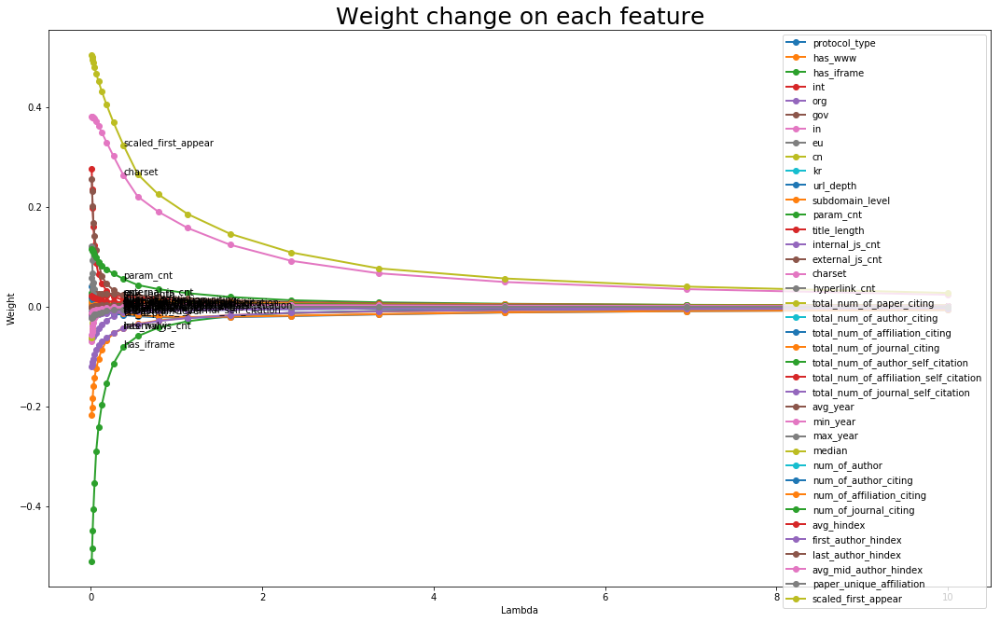

In [14]:
Visualizer.plot_importance_trending(X_train, performance_matrix, 'Weight change on each feature', 10)

<module 'matplotlib.pyplot' from '/home/jjian03/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py'>

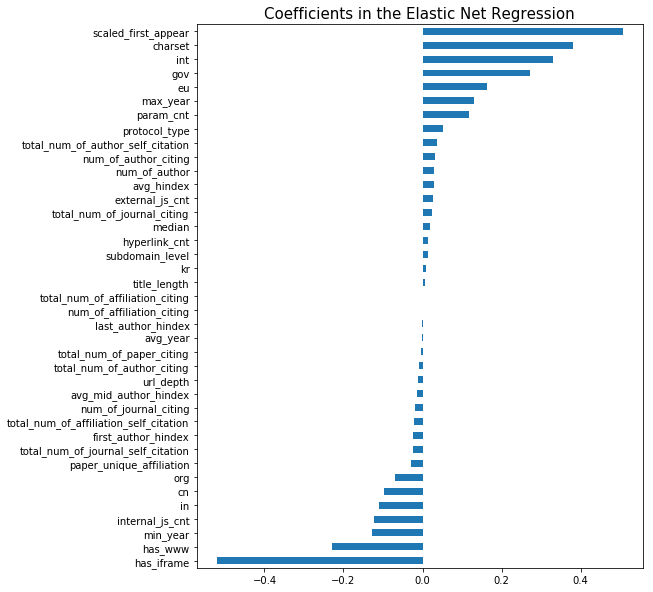

In [15]:
Visualizer.plot_feature_importance(
    result_train.best_result.model.coef_, X_train.columns, 
    "Coefficients in the Elastic Net Regression")

#### 2nd Edition - Lasso Regression to Select Features

In [16]:
from sklearn.linear_model import Lasso


start_time = time.time()
param_lso = {
    'alpha': sorted(np.logspace(-2, -1, 20)),
    'max_iter': np.arange(10,80,40),
}


lso = Lasso(random_state=seed)


# Start to train model
result_train, result_test = AnalysisEngineBuilder() \
    .set_X_train(X_train) \
    .set_y_train(y_train) \
    .set_X_test(X_test) \
    .set_y_test(y_test) \
    .set_param_grid(param_lso) \
    .set_engine(lso) \
    .set_train_strategy(VerboseGridSearchStrategy) \
    .build()

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

--- 00 minutes, 10.38 seconds ---


In [17]:
performance_matrix = build_visualization_matrix(result_train, result_test)

In [18]:
Visualizer.plot_loss_trend(performance_matrix, 'alpha', 'mse', 'type', 'MSE Trending on Train/Test Set')


In [19]:
Visualizer.plot_loss_trend(performance_matrix, 'alpha', 'r_2', 'type', 'Adjust R^2 Trending on Train/Test Set')


<module 'matplotlib.pyplot' from '/home/jjian03/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py'>

<Figure size 576x720 with 0 Axes>

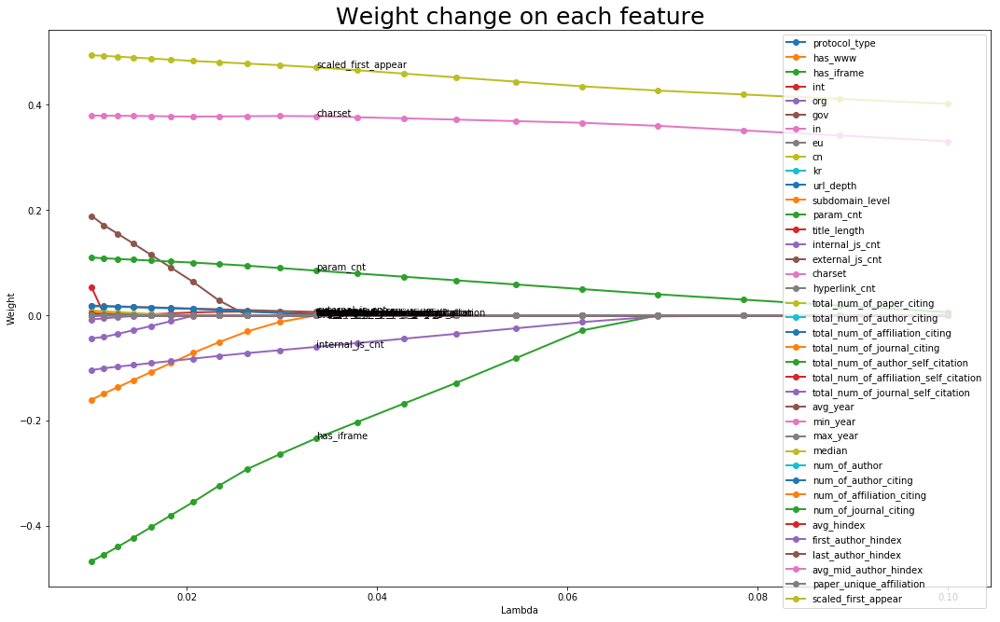

In [20]:
Visualizer.plot_importance_trending(X_train, performance_matrix, 'Weight change on each feature', 10)

In [21]:
start_time = time.time()
param_lso = {
    'alpha': [0.035],
    'max_iter': np.arange(10,80,40),
}


lso = Lasso(random_state=seed)


# Start to train model
result_train, result_test = AnalysisEngineBuilder() \
    .set_X_train(X_train) \
    .set_y_train(y_train) \
    .set_X_test(X_test) \
    .set_y_test(y_test) \
    .set_param_grid(param_lso) \
    .set_engine(lso) \
    .set_train_strategy(GridSearchStrategy) \
    .build()

result_train.best_result.show_performance()
print()
result_test.best_result.show_performance()

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

R^2 on Training Set: 13.4%


,Coefficients,Standard Errors,t values,Probabilities
Constant,29.6633,0.036,819.079,0.000
scaled_first_appear,0.4694,0.010,45.641,0.000
charset,0.3776,0.010,36.605,0.000
param_cnt,0.0834,0.009,8.934,0.000
external_js_cnt,0.0062,0.010,0.636,0.525
title_length,0.0030,0.011,0.276,0.783
has_www,-0.0000,0.024,-0.000,1.000
total_num_of_journal_self_citation,-0.0000,0.010,-0.000,1.000
avg_year,0.0000,0.835,0.000,1.000
min_year,0.0000,0.175,0.000,1.000



R^2 on Testing Set: 12.98%


,Coefficients,Standard Errors,t values,Probabilities
Constant,29.6633,0.054,552.164,0.000
scaled_first_appear,0.4694,0.015,30.573,0.000
charset,0.3776,0.016,24.315,0.000
param_cnt,0.0834,0.014,5.961,0.000
external_js_cnt,0.0062,0.013,0.469,0.639
title_length,0.0030,0.016,0.186,0.852
has_www,-0.0000,0.035,-0.000,1.000
total_num_of_journal_self_citation,-0.0000,0.014,-0.000,1.000
avg_year,0.0000,1.187,0.000,1.000
min_year,0.0000,0.261,0.000,1.000


--- 00 minutes, 0.77 seconds ---


In [22]:
rpt = result_test.best_result.rpt


In [23]:
rpt[rpt.Coefficients == 0]

,Coefficients,Standard Errors,t values,Probabilities
has_www,-0.0,0.035,-0.0,1.0
total_num_of_journal_self_citation,-0.0,0.014,-0.0,1.0
avg_year,0.0,1.187,0.0,1.0
min_year,0.0,0.261,0.0,1.0
max_year,0.0,1.013,0.0,1.0
median,0.0,0.014,0.0,1.0
num_of_author,0.0,0.025,0.0,1.0
total_num_of_author_self_citation,0.0,0.025,0.0,1.0
num_of_author_citing,0.0,0.060,0.0,1.0
num_of_affiliation_citing,0.0,0.053,0.0,1.0


In [24]:
rpt.sort_values(by=['Probabilities', 'Standard Errors'])

,Coefficients,Standard Errors,t values,Probabilities
param_cnt,0.0834,0.014,5.961,0.000
internal_js_cnt,-0.0572,0.014,-4.082,0.000
scaled_first_appear,0.4694,0.015,30.573,0.000
charset,0.3776,0.016,24.315,0.000
has_iframe,-0.2231,0.041,-5.500,0.000
Constant,29.6633,0.054,552.164,0.000
external_js_cnt,0.0062,0.013,0.469,0.639
title_length,0.0030,0.016,0.186,0.852
hyperlink_cnt,0.0000,0.010,0.000,1.000
total_num_of_journal_self_citation,-0.0000,0.014,-0.000,1.000


<module 'matplotlib.pyplot' from '/home/jjian03/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py'>

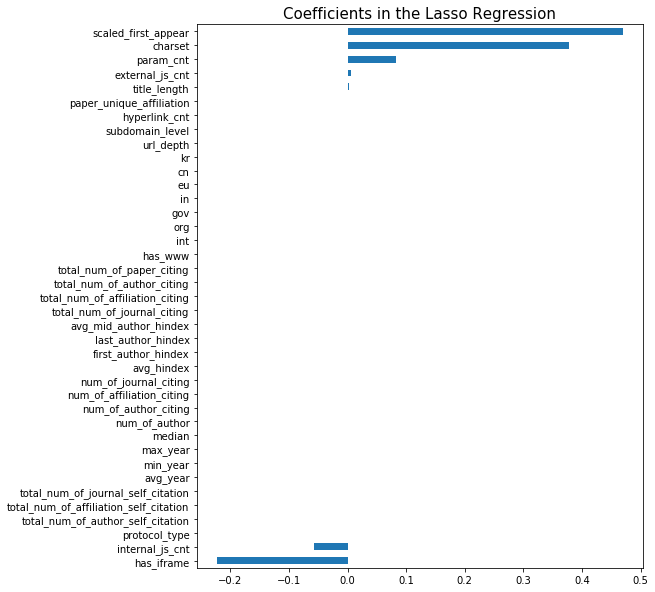

In [25]:
Visualizer.plot_feature_importance(
    result_train.best_result.model.coef_, X_train.columns, 
    "Coefficients in the Lasso Regression")

#### 3rd Edition - Use Selected Features to run Lasso Regression Again

- Manually select features

In [26]:
features = set(tuple([
    'org',
    'gov',
    'int',
    'in',
    'cn',
    'eu',
]))

for col_name in rpt[rpt.Coefficients != 0].index.tolist():
    features.add(col_name)

features.remove('Constant')

In [27]:
features

{'charset',
 'cn',
 'eu',
 'external_js_cnt',
 'gov',
 'has_iframe',
 'in',
 'int',
 'internal_js_cnt',
 'org',
 'param_cnt',
 'scaled_first_appear',
 'title_length'}

In [28]:
start_time = time.time()
param_lso = {
    'alpha': sorted(np.logspace(-2, -1, 20)),
    'max_iter': np.arange(10,80,40),
}


lso = Lasso(random_state=seed)


# Start to train model
result_train, result_test = AnalysisEngineBuilder() \
    .set_X_train(X_train[features]) \
    .set_y_train(y_train) \
    .set_X_test(X_test[features]) \
    .set_y_test(y_test) \
    .set_param_grid(param_lso) \
    .set_engine(lso) \
    .set_train_strategy(VerboseGridSearchStrategy) \
    .build()

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

--- 00 minutes, 6.56 seconds ---


In [29]:
performance_matrix = build_visualization_matrix(result_train, result_test)

<module 'matplotlib.pyplot' from '/home/jjian03/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py'>

<Figure size 576x720 with 0 Axes>

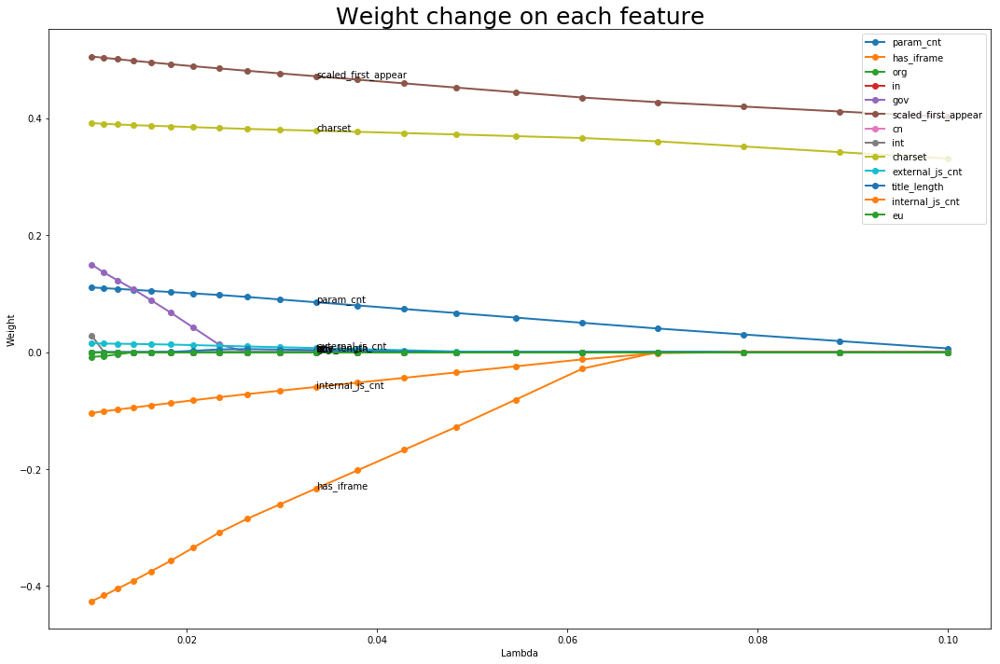

In [30]:
Visualizer.plot_importance_trending(X_train[features], performance_matrix, 'Weight change on each feature', 10)

In [31]:
start_time = time.time()
param_lso = {
    'alpha': [0.035],
    'max_iter': np.arange(10,80,40),
}


lso = Lasso(random_state=seed)


# Start to train model
result_train, result_test = AnalysisEngineBuilder() \
    .set_X_train(X_train[features]) \
    .set_y_train(y_train) \
    .set_X_test(X_test[features]) \
    .set_y_test(y_test) \
    .set_param_grid(param_lso) \
    .set_engine(lso) \
    .set_train_strategy(GridSearchStrategy) \
    .build()

result_train.best_result.show_performance()
print()
result_test.best_result.show_performance()

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

R^2 on Training Set: 13.4%


,Coefficients,Standard Errors,t values,Probabilities
Constant,29.6634,0.024,1235.105,0.000
scaled_first_appear,0.4694,0.010,49.275,0.000
charset,0.3776,0.010,38.750,0.000
param_cnt,0.0834,0.009,9.048,0.000
external_js_cnt,0.0062,0.010,0.640,0.522
title_length,0.0030,0.011,0.279,0.780
org,-0.0000,0.022,-0.000,1.000
in,-0.0000,0.171,-0.000,1.000
gov,0.0000,0.029,0.000,1.000
cn,-0.0000,0.141,-0.000,1.000



R^2 on Testing Set: 12.98%


,Coefficients,Standard Errors,t values,Probabilities
Constant,29.6634,0.035,836.203,0.000
scaled_first_appear,0.4694,0.014,32.971,0.000
charset,0.3776,0.015,25.661,0.000
param_cnt,0.0834,0.014,6.077,0.000
external_js_cnt,0.0062,0.013,0.472,0.637
title_length,0.0030,0.016,0.189,0.850
org,-0.0000,0.033,-0.000,1.000
in,-0.0000,0.258,-0.000,1.000
gov,0.0000,0.044,0.000,1.000
cn,-0.0000,0.198,-0.000,1.000


--- 00 minutes, 0.34 seconds ---


In [32]:
rpt = result_test.best_result.rpt


In [33]:
rpt[rpt.Coefficients == 0]

,Coefficients,Standard Errors,t values,Probabilities
org,-0.0,0.033,-0.0,1.0
in,-0.0,0.258,-0.0,1.0
gov,0.0,0.044,0.0,1.0
cn,-0.0,0.198,-0.0,1.0
int,0.0,0.085,0.0,1.0
eu,0.0,0.119,0.0,1.0


In [34]:
rpt.sort_values(by=['Probabilities', 'Standard Errors'])

,Coefficients,Standard Errors,t values,Probabilities
scaled_first_appear,0.4694,0.014,32.971,0.000
param_cnt,0.0834,0.014,6.077,0.000
internal_js_cnt,-0.0572,0.014,-4.094,0.000
charset,0.3776,0.015,25.661,0.000
Constant,29.6634,0.035,836.203,0.000
has_iframe,-0.2231,0.040,-5.635,0.000
external_js_cnt,0.0062,0.013,0.472,0.637
title_length,0.0030,0.016,0.189,0.850
org,-0.0000,0.033,-0.000,1.000
gov,0.0000,0.044,0.000,1.000


<module 'matplotlib.pyplot' from '/home/jjian03/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py'>

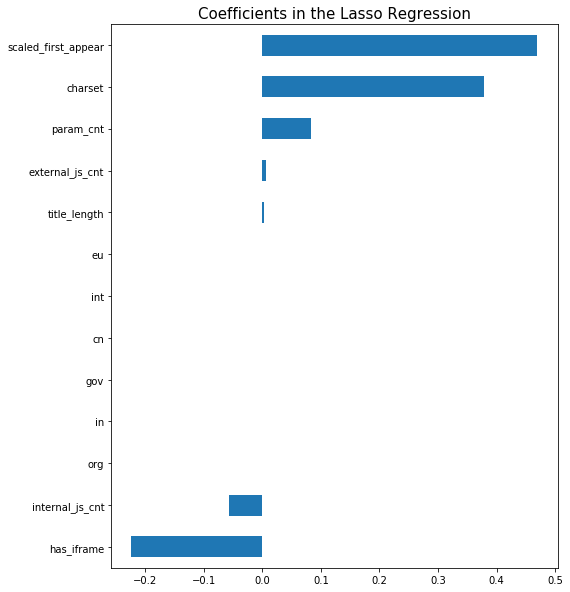

In [35]:
Visualizer.plot_feature_importance(
    result_train.best_result.model.coef_, X_train[features].columns, 
    "Coefficients in the Lasso Regression")

#### 4th Edition - Retrain the Elastic Net Regressor with Selected Features

In [36]:
features = rpt[rpt.Coefficients != 0].index.tolist()[1:]
features

['scaled_first_appear',
 'charset',
 'param_cnt',
 'external_js_cnt',
 'title_length',
 'internal_js_cnt',
 'has_iframe']

In [37]:
start_time = time.time()
param_en = {
    'l1_ratio': [0, *np.logspace(-3, 0, 5)],
    'alpha': sorted(np.logspace(-2, 1, 20)),
    'max_iter': np.arange(10,80,40),
}


en = ElasticNet(random_state=seed,
                       warm_start=False,
)


# Start to train model
result_train, result_test = AnalysisEngineBuilder() \
    .set_X_train(X_train[features]) \
    .set_y_train(y_train) \
    .set_X_test(X_test[features]) \
    .set_y_test(y_test) \
    .set_param_grid(param_en) \
    .set_engine(en) \
    .set_train_strategy(VerboseGridSearchStrategy) \
    .build()

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

--- 00 minutes, 35.67 seconds ---


In [38]:
performance_matrix = build_visualization_matrix(result_train, result_test)

In [39]:
Visualizer.plot_loss_trend(performance_matrix, 'alpha', 'mse', 'type', 'MSE Trending on Train/Test Set')


In [40]:
Visualizer.plot_loss_trend(performance_matrix, 'alpha', 'r_2', 'type', 'Adjust R^2 Trending on Train/Test Set')


<module 'matplotlib.pyplot' from '/home/jjian03/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py'>

<Figure size 576x720 with 0 Axes>

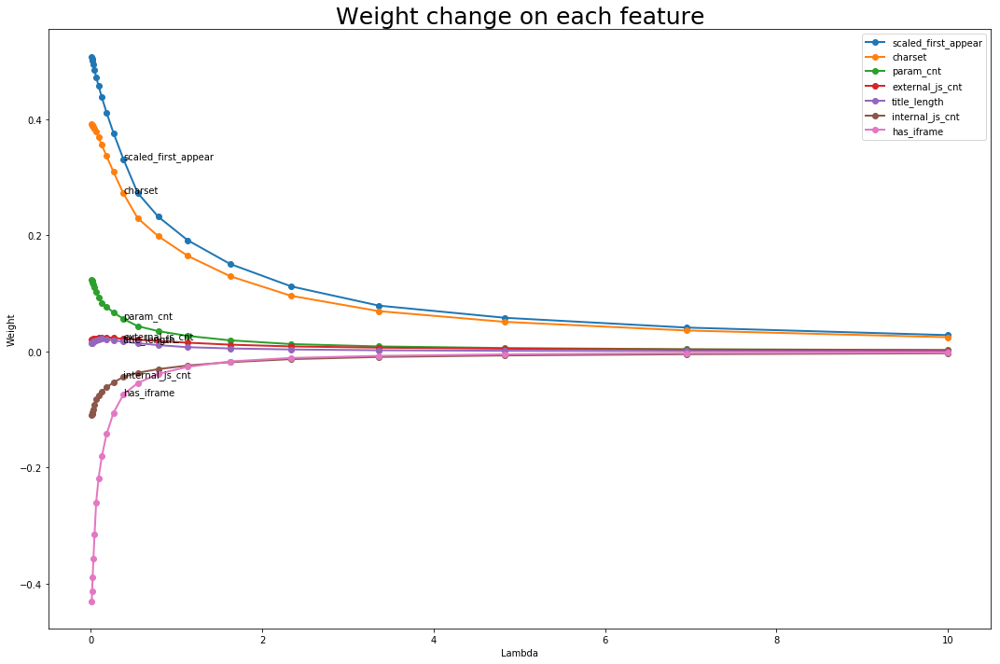

In [41]:
Visualizer.plot_importance_trending(X_train[features], performance_matrix, 'Weight change on each feature', 10)

In [42]:
start_time = time.time()
param_en = {
    'l1_ratio': [0, *np.logspace(-3, 0, 5)],
    'alpha': sorted(np.logspace(-2, 1, 20)),
    'max_iter': np.arange(10,80,40),
}


en = ElasticNet(random_state=seed,
                       warm_start=False,
)


# Start to train model
result_train, result_test = AnalysisEngineBuilder() \
    .set_X_train(X_train[features]) \
    .set_y_train(y_train) \
    .set_X_test(X_test[features]) \
    .set_y_test(y_test) \
    .set_param_grid(param_en) \
    .set_engine(en) \
    .set_train_strategy(GridSearchStrategy) \
    .build()

result_train.best_result.show_performance()
print()
result_test.best_result.show_performance()

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

R^2 on Training Set: 13.79%


,Coefficients,Standard Errors,t values,Probabilities
Constant,29.8356,0.022,1327.652,0.000
scaled_first_appear,0.5092,0.009,54.001,0.000
charset,0.3915,0.009,41.755,0.000
param_cnt,0.1251,0.009,13.681,0.000
external_js_cnt,0.0220,0.010,2.272,0.023
title_length,0.0148,0.010,1.454,0.146
internal_js_cnt,-0.1129,0.009,-12.066,0.000
has_iframe,-0.4371,0.026,-17.060,0.000



R^2 on Testing Set: 13.2%


,Coefficients,Standard Errors,t values,Probabilities
Constant,29.8356,0.033,896.258,0.000
scaled_first_appear,0.5092,0.014,36.105,0.000
charset,0.3915,0.014,27.747,0.000
param_cnt,0.1251,0.014,9.165,0.000
external_js_cnt,0.0220,0.013,1.673,0.094
title_length,0.0148,0.015,0.978,0.328
internal_js_cnt,-0.1129,0.014,-8.145,0.000
has_iframe,-0.4371,0.038,-11.500,0.000


--- 00 minutes, 27.62 seconds ---


<module 'matplotlib.pyplot' from '/home/jjian03/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py'>

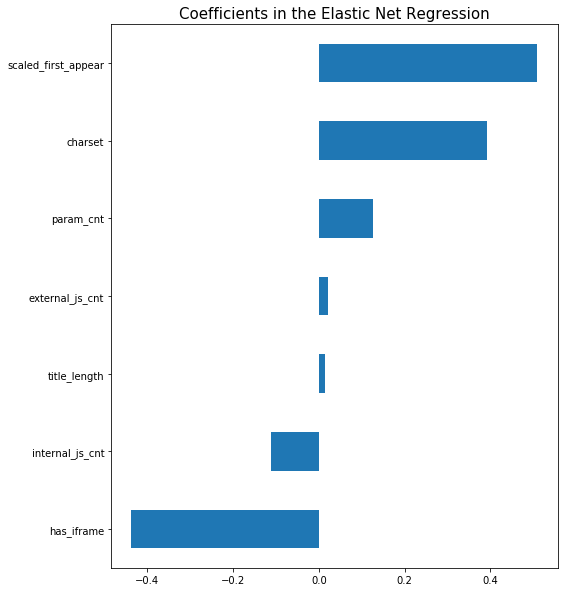

In [43]:
Visualizer.plot_feature_importance(
    result_train.best_result.model.coef_, X_train[features].columns, 
    "Coefficients in the Elastic Net Regression")